In [126]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import argparse
import time

import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
print("Tensorflow version", tf.__version__)

import defaults
import eval_utils
import graph_manager
import viz
import odgi_graph
import standard_graph
import tf_utils

Tensorflow version 1.10.1


In [88]:
def build_configuration(log_dir, batch_size=16, with_offsets=True):
    aux = os.path.dirname(os.path.dirname(os.path.normpath(log_dir)))
    # Datatype
    data = os.path.split(aux)[1]
    configuration = {}
    if data.startswith('vedai'):
        configuration['setting'] = data
        configuration['image_format'] = 'vedai'
    elif data == 'sdd':
        configuration['setting'] = 'sdd'
        configuration['image_format'] = 'sdd'
    elif data == 'dota':
        configuration['setting'] = 'dota'
        configuration['image_format'] = 'dota'
    else:
        raise ValueError("unknown data", data)
    
    # Metadata
    tfrecords_path = 'Data/metadata_%s.txt'
    metadata = defaults.load_metadata(tfrecords_path % configuration['setting'])
    configuration.update(metadata)

    # Architecture
    aux = os.path.split(os.path.dirname(os.path.normpath(log_dir)))[1]
    aux = aux.split('_')
    configuration['network'] = aux[0]
    mode = aux[1]

    assert mode.startswith('odgi')
    with_groups = mode.replace('odgi', '') != 'nogroups'
    assert len(aux) in [4, 5]
    stage1_configuration = configuration.copy()
    stage2_configuration = configuration.copy()

    # Batch size
    stage1_configuration['batch_size'] = batch_size
    stage2_configuration['batch_size'] = None 

    # Image sizes
    stage1_configuration['image_size'] = int(aux[2])
    stage2_configuration['image_size'] = int(aux[3])
    stage2_configuration['network'] = 'tiny-yolov2'

    # Group flags
    stage1_configuration['base_name'] = 'stage1'
    stage1_configuration['with_groups'] = with_groups
    stage1_configuration['with_group_flags'] = with_groups
    stage1_configuration['with_offsets'] = with_offsets
    graph_manager.finalize_grid_offsets(stage1_configuration, verbose=0)
    stage2_configuration['previous_batch_size'] = stage1_configuration['batch_size'] 
    stage2_configuration['base_name'] = 'stage2'
    graph_manager.finalize_grid_offsets(stage2_configuration, verbose=0)
    
    # Return
    return configuration, stage1_configuration, stage2_configuration

In [89]:
def build_graph(stage1_configuration, 
                stage2_configuration,
                test_num_crops=5,
                test_patch_confidence_threshold=0.1,
                test_patch_strong_confidence_threshold=0.8,
                test_patch_nms_threshold=0.25,
                viz_s1_threshold=0.25,
                viz_s2_threshold=0.75):
    # crop extraction
    stage1_configuration["test_num_crops"] = test_num_crops                           
    stage1_configuration["test_patch_nms_threshold"] = test_patch_nms_threshold                
    stage1_configuration["test_patch_confidence_threshold"] = test_patch_confidence_threshold 
    stage1_configuration["test_patch_strong_confidence_threshold"] = test_patch_strong_confidence_threshold

    # Graph
    use_test_split = tf.placeholder_with_default(True, (), 'choose_eval_split')
    with tf.device('/gpu:0'):
        eval_inputs, eval_initializer = tf.cond(
            use_test_split,
            true_fn=lambda: graph_manager.get_inputs(mode='test', verbose=False, **stage1_configuration),
            false_fn=lambda: graph_manager.get_inputs(mode='val', verbose=False, **stage1_configuration),
            name='eval_inputs')
        eval_s1_outputs = odgi_graph.eval_pass_intermediate_stage(eval_inputs,
                                                                  stage1_configuration, 
                                                                  reuse=False, 
                                                                  verbose=False) 
        eval_s2_inputs = odgi_graph.feed_pass(eval_inputs, 
                                              eval_s1_outputs["crop_boxes"],
                                              stage2_configuration, 
                                              mode='test', 
                                              verbose=False)
        eval_s2_outputs = odgi_graph.eval_pass_final_stage(eval_s2_inputs, 
                                                           eval_s1_outputs["crop_boxes"], 
                                                           stage2_configuration,
                                                           reuse=False,
                                                           verbose=False)
    # Draw
    output = {}
    s1_bbs = eval_s1_outputs['bounding_boxes']
    s1_bbs *= tf.to_float(eval_s1_outputs['confidence_scores'] > viz_s1_threshold)
    all_bbs = eval_s2_outputs['bounding_boxes']
    all_bbs *= tf.to_float(eval_s2_outputs['confidence_scores'] > viz_s2_threshold)
    # initial bounding boxes (confident individuals)
    output['Ground-truth'] = viz.draw_bounding_boxes(eval_inputs['image'], eval_inputs['bounding_boxes'])
    # Kept-out boxes
    output['Short-cut'] = viz.draw_bounding_boxes(
        eval_inputs['image'], tf.expand_dims(eval_s1_outputs['kept_out_filter'], axis=-1) * 
    tf_utils.flatten_percell_output(s1_bbs))
    # Groups
    if 'group_classification_logits' in eval_s1_outputs:
        group_flags = tf.to_float(tf.nn.sigmoid(eval_s1_outputs['group_classification_logits']) > 0.5)
        output['Groups'] = viz.draw_bounding_boxes(eval_inputs['image'], group_flags * s1_bbs)
    # Crop-Boxes
    output['Patches'] = viz.draw_bounding_boxes(eval_inputs['image'], eval_s1_outputs['crop_boxes'])
    # Final predictions
    output['final'] = viz.draw_bounding_boxes(eval_inputs['image'], all_bbs)
    # Return
    return use_test_split, eval_initializer, output

In [95]:
def run_sess(log_dir,
             batch_size,
             with_offsets,
             test_num_crops,
             test_patch_confidence_threshold,
             test_patch_strong_confidence_threshold,
             test_patch_nms_threshold,
             viz_s1_threshold,
             viz_s2_threshold,
             skip=0):
    with tf.Graph().as_default():
        # Build config
        _, stage1_configuration, stage2_configuration = build_configuration(
            log_dir, batch_size=batch_size, with_offsets=with_offsets)
        # Build the graph    
        use_test_split, initializer, output = build_graph(
            stage1_configuration, 
            stage2_configuration,
            test_num_crops=test_num_crops,
            test_patch_confidence_threshold=test_patch_confidence_threshold,
            test_patch_strong_confidence_threshold=test_patch_strong_confidence_threshold,
            test_patch_nms_threshold=test_patch_nms_threshold,
            viz_s1_threshold=viz_s1_threshold,
            viz_s2_threshold=viz_s2_threshold)
        feed_dict = {use_test_split: True}
        session_creator = tf.train.ChiefSessionCreator(
            checkpoint_dir=log_dir, config=tf.ConfigProto(allow_soft_placement=True))

        # Start session
        with tf.train.MonitoredSession(session_creator=session_creator) as sess:
            sess.run(initializer)
            for _ in range(skip):
                sess.run(output)
            output_ = sess.run(output)     
            return output_

In [96]:
def run_plot(output_, id, figsize=(12, 12)):
    for key, value in output_.items():
        print(key)
        plt.figure(figsize=figsize)
        plt.imshow(value[id])
        plt.axis('off')
        plt.show()

### Normal ODGI

In [118]:
log_dir = './log/sdd/tiny-yolov2_odgi_512_256/10-04_10-18/'
batch_size = 16
with_offsets = True
test_num_crops = 5
test_patch_confidence_threshold = 0.1
test_patch_strong_confidence_threshold = 0.6
test_patch_nms_threshold = 0.25
viz_s1_threshold = 0.25
viz_s2_threshold = 0.5
skip = 50
skip = 200
skip = 100
odgi_output = run_sess(log_dir, batch_size, with_offsets, test_num_crops, test_patch_confidence_threshold,
                        test_patch_strong_confidence_threshold, test_patch_nms_threshold,
                        viz_s1_threshold, viz_s2_threshold, skip=skip)

INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./log/sdd/tiny-yolov2_odgi_512_256/10-04_10-18/model.ckpt-38176
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


Ground-truth


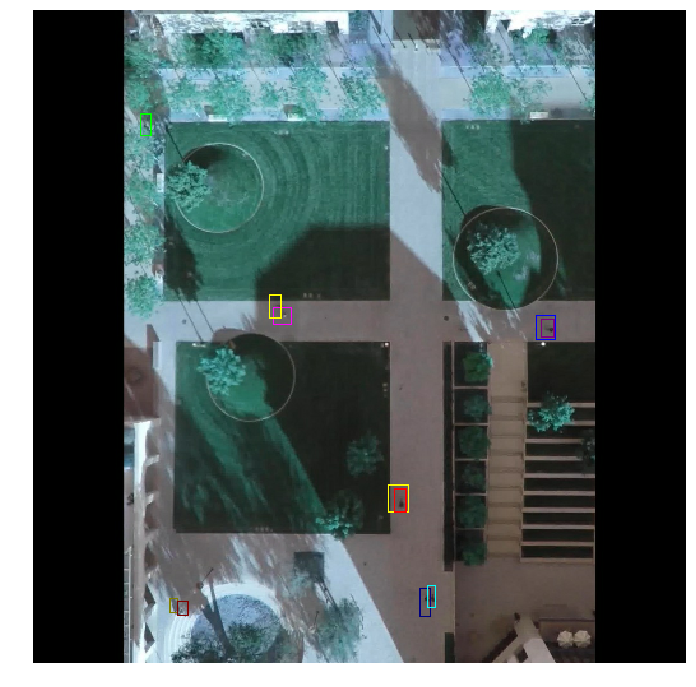

Short-cut


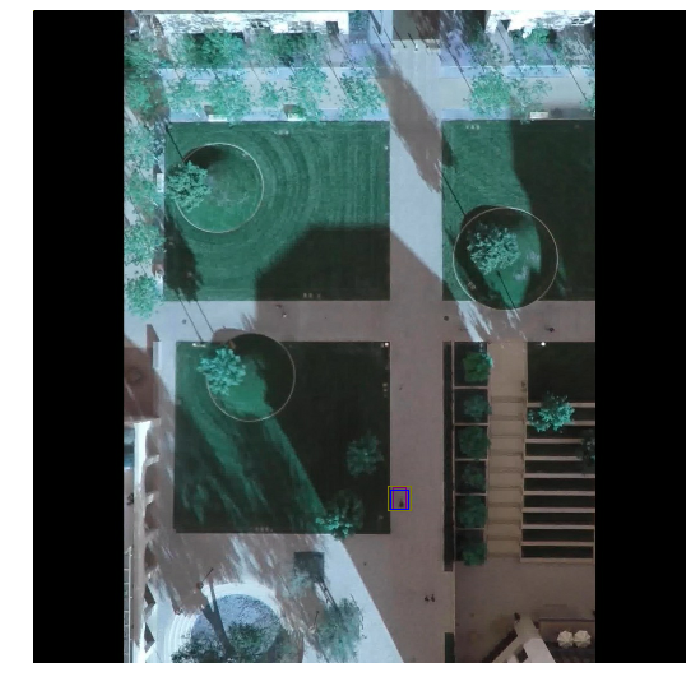

Groups


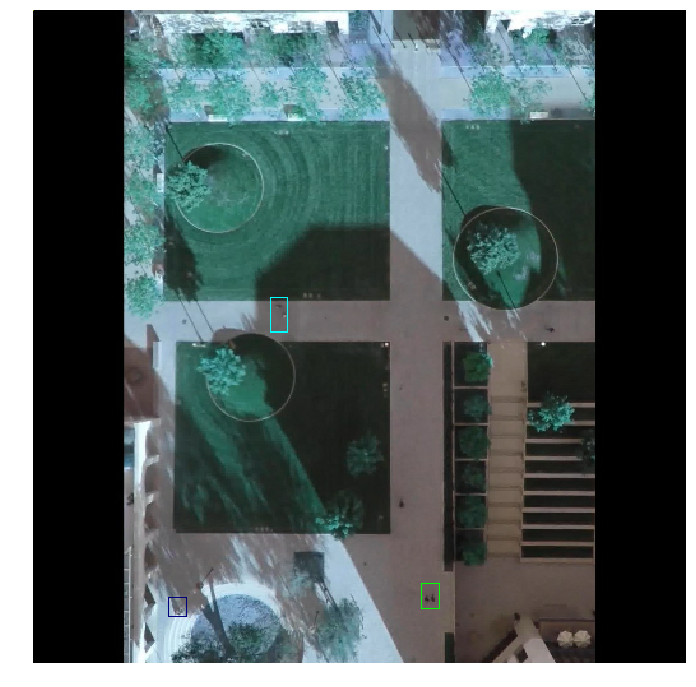

Patches


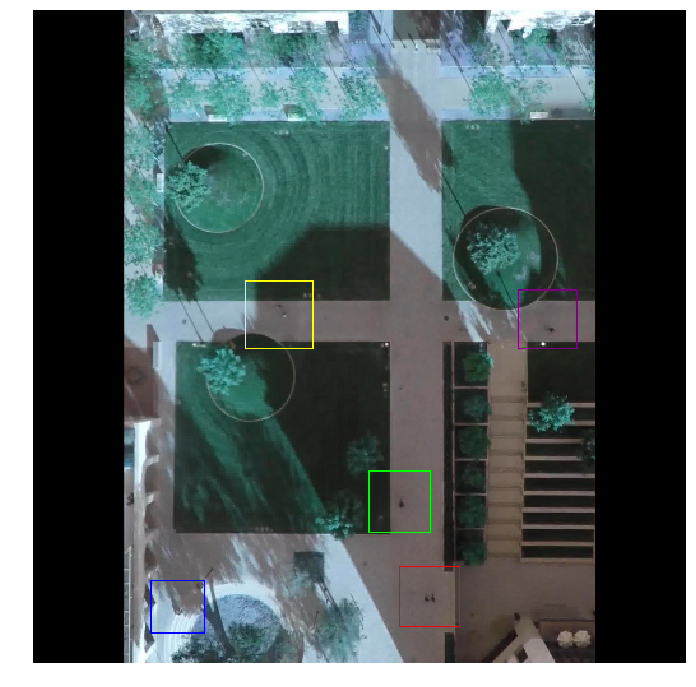

final


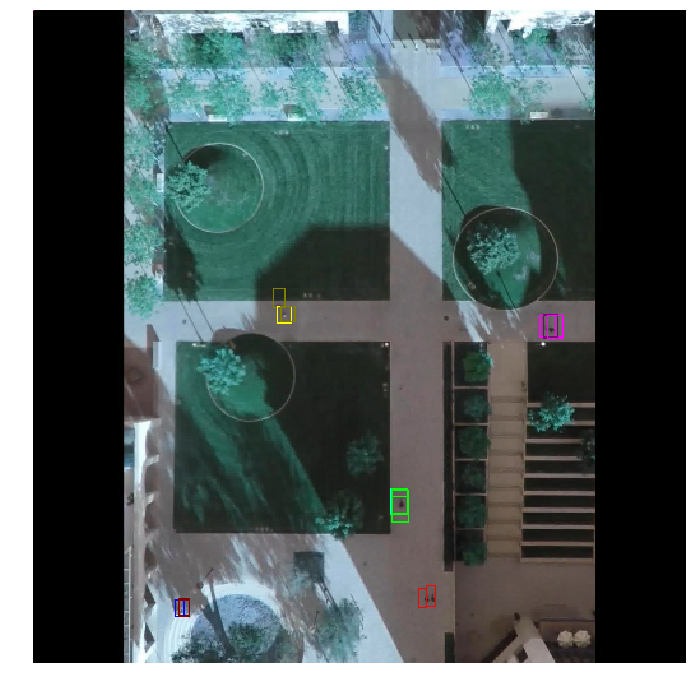

In [119]:
id = 1
run_plot(odgi_output, id)

# ODGI without offset

In [116]:
log_dir = './log/sdd/tiny-yolov2_odgi_512_256/10-04_10-18/'
batch_size = 16
with_offsets = False
test_num_crops = 5
test_patch_confidence_threshold = 0.1
test_patch_strong_confidence_threshold = 0.6
test_patch_nms_threshold = 0.25
viz_s1_threshold = 0.25
viz_s2_threshold = 0.5
skip = 50
skip = 200
skip = 100
odgi_output_nooffsets = run_sess(
    log_dir, batch_size, with_offsets, test_num_crops, test_patch_confidence_threshold,
    test_patch_strong_confidence_threshold, test_patch_nms_threshold,
    viz_s1_threshold, viz_s2_threshold, skip=skip)

INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./log/sdd/tiny-yolov2_odgi_512_256/10-04_10-18/model.ckpt-38176
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


Ground-truth


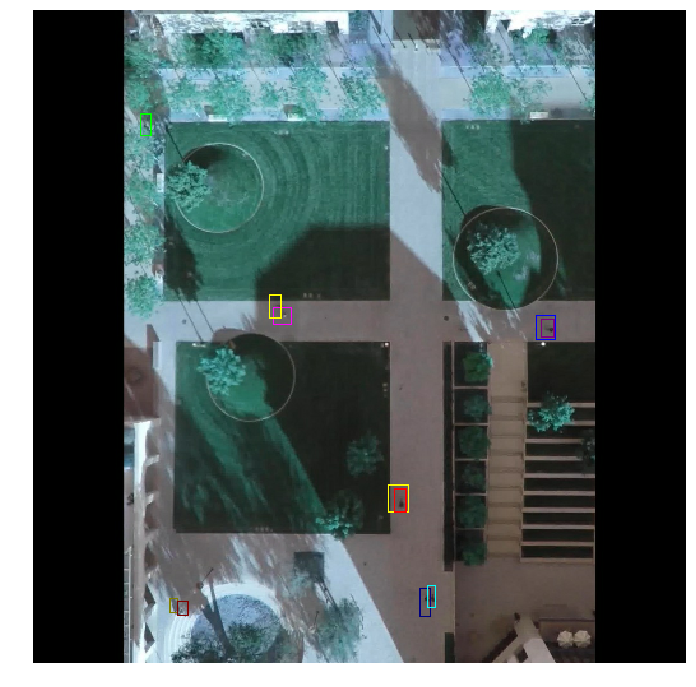

Short-cut


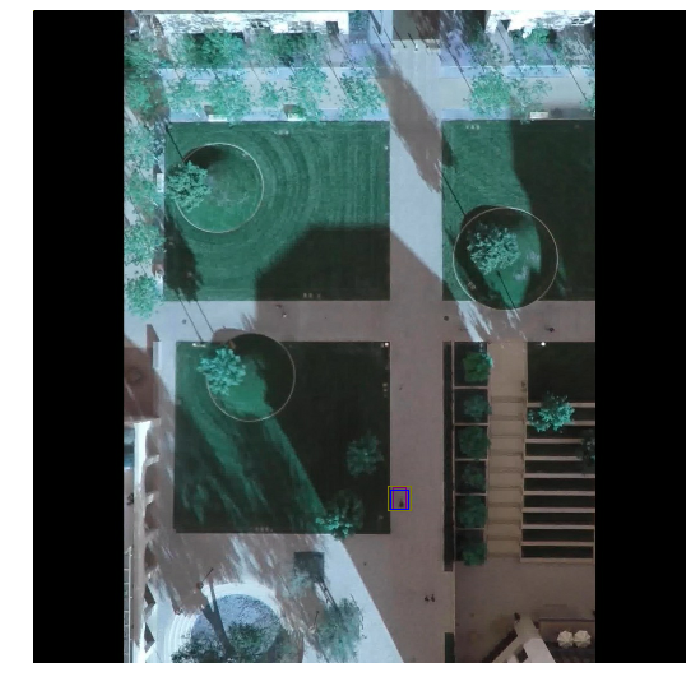

Groups


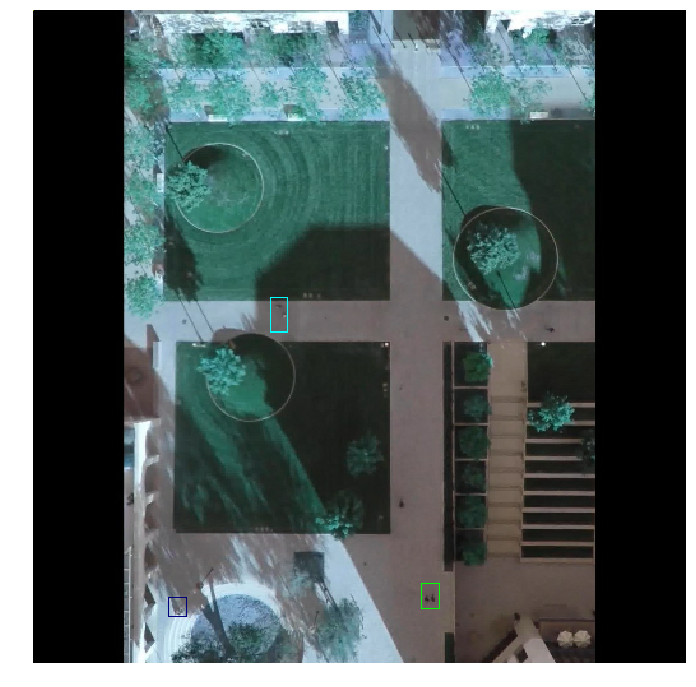

Patches


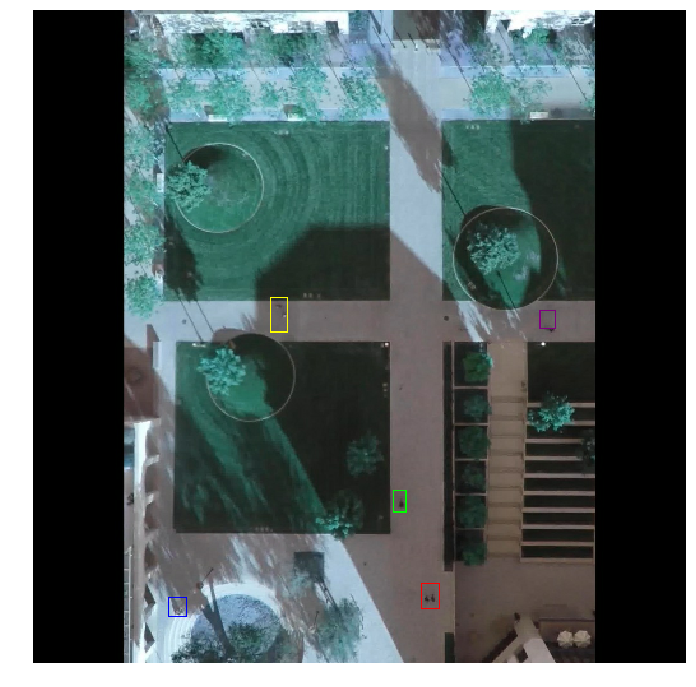

final


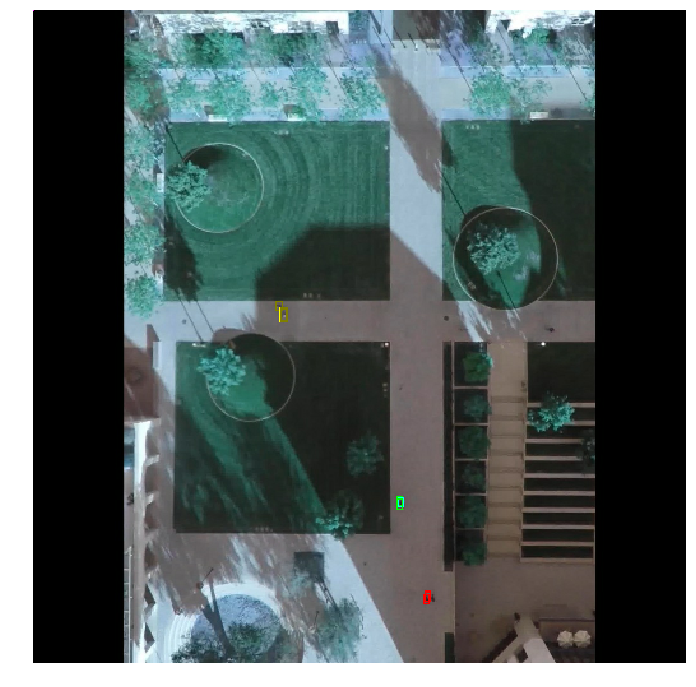

In [117]:
id = 1
run_plot(odgi_output_nooffsets, id)

# ODGI singles

In [114]:
log_dir = './log/sdd/tiny-yolov2_odginogroups_512_256/10-10_13-57/'
batch_size = 16
with_offsets = True
test_num_crops = 5
test_patch_confidence_threshold = 0.1
test_patch_strong_confidence_threshold = 0.6
test_patch_nms_threshold = 0.25
viz_s1_threshold = 0.25
viz_s2_threshold = 0.5
skip = 50
skip = 200
skip = 100
odgi_singles_output = run_sess(
    log_dir, batch_size, with_offsets, test_num_crops, test_patch_confidence_threshold,
    test_patch_strong_confidence_threshold, test_patch_nms_threshold,
    viz_s1_threshold, viz_s2_threshold, skip=skip)

INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./log/sdd/tiny-yolov2_odginogroups_512_256/10-10_13-57/model.ckpt-38176
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


Ground-truth


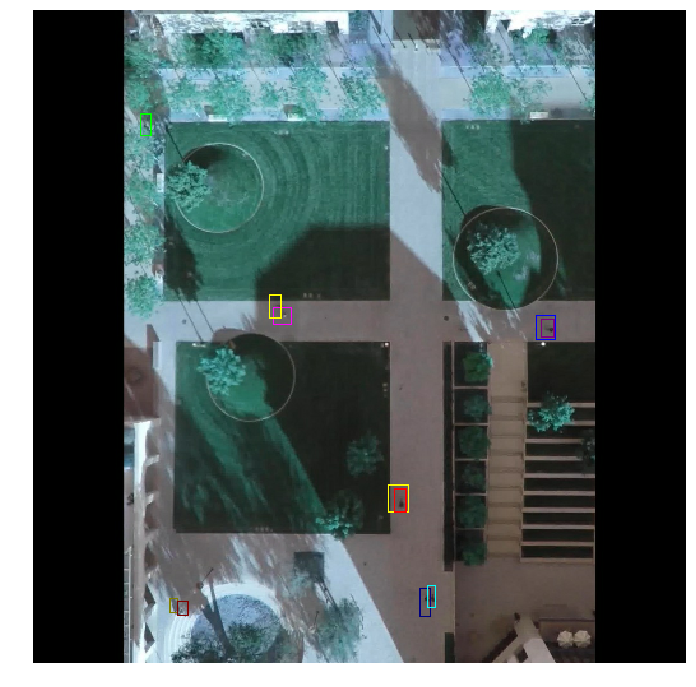

Short-cut


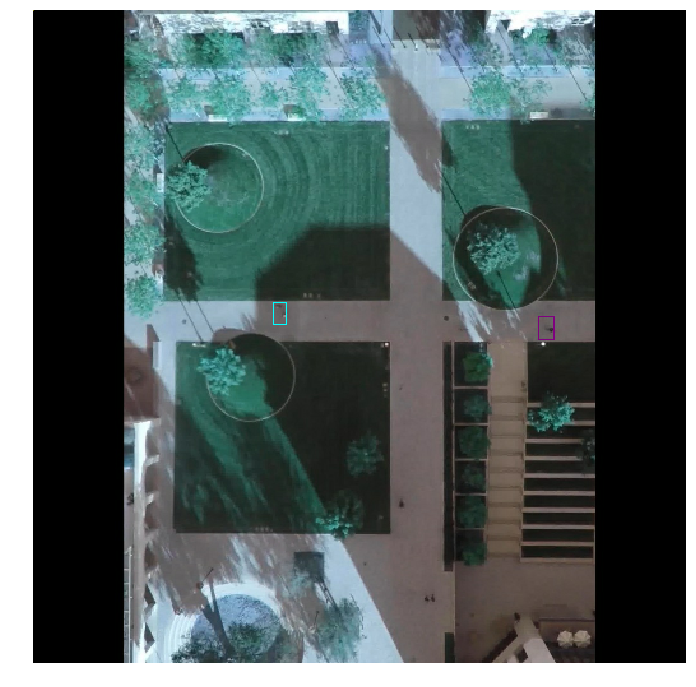

Patches


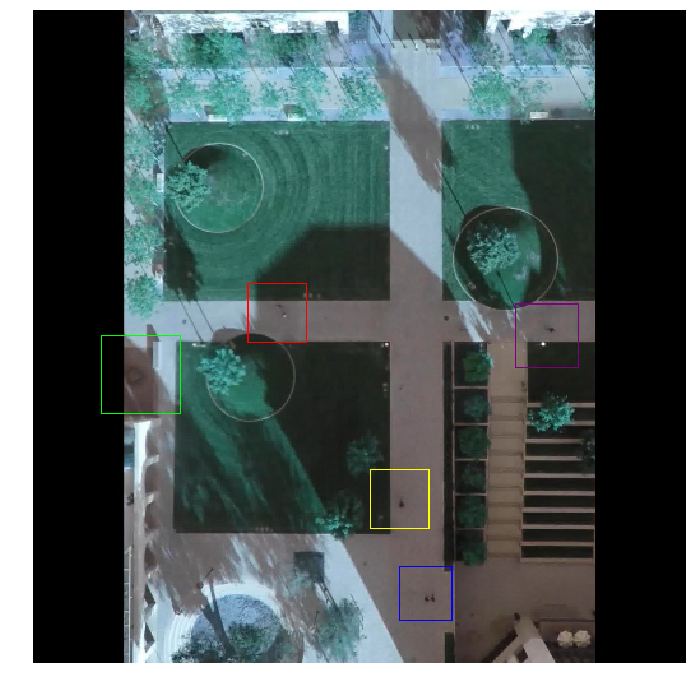

final


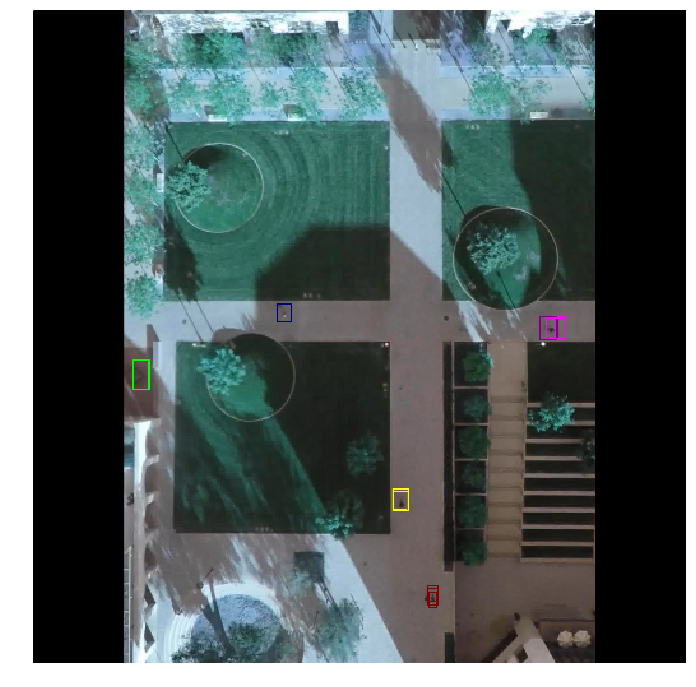

In [115]:
id = 1
run_plot(odgi_singles_output, id)

# ODGI singles - no offsets

In [85]:
log_dir = './log/sdd/tiny-yolov2_odginogroups_512_256/10-10_13-57/'
batch_size = 16
with_offsets = False
test_num_crops = 5
test_patch_confidence_threshold = 0.1
test_patch_strong_confidence_threshold = 0.6
test_patch_nms_threshold = 0.25
viz_s1_threshold = 0.25
viz_s2_threshold = 0.5
odgi_singles_nooffsets_output = run_sess(
    log_dir, batch_size, with_offsets, test_num_crops, test_patch_confidence_threshold,
    test_patch_strong_confidence_threshold, test_patch_nms_threshold,
    viz_s1_threshold, viz_s2_threshold)

INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./log/sdd/tiny-yolov2_odginogroups_512_256/10-10_13-57/model.ckpt-38176
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


Ground-truth


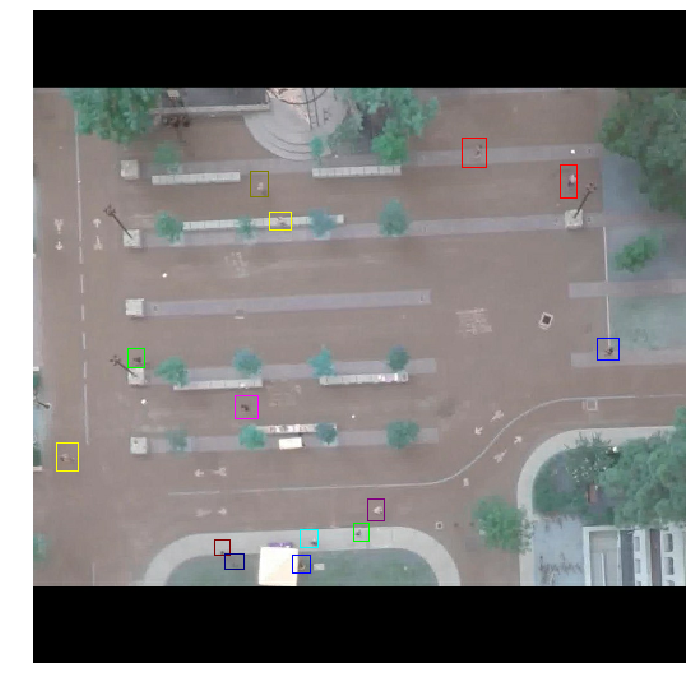

Short-cut


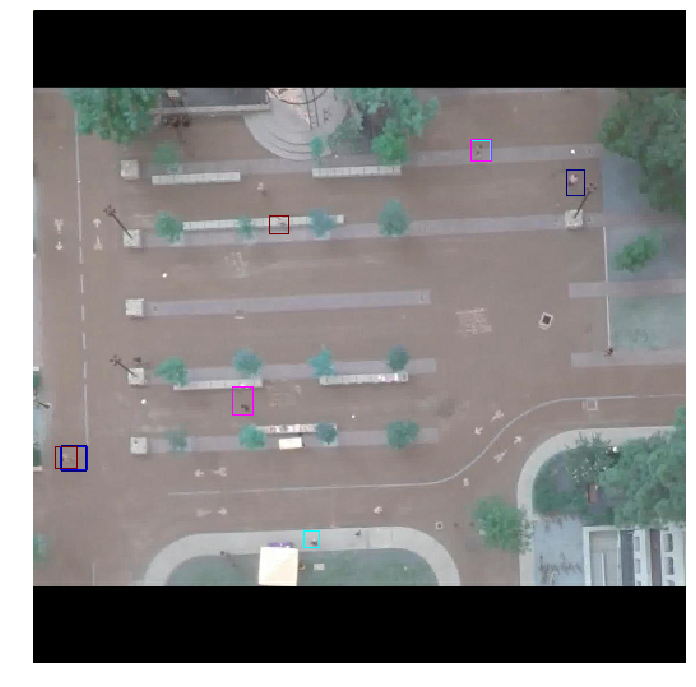

Patches


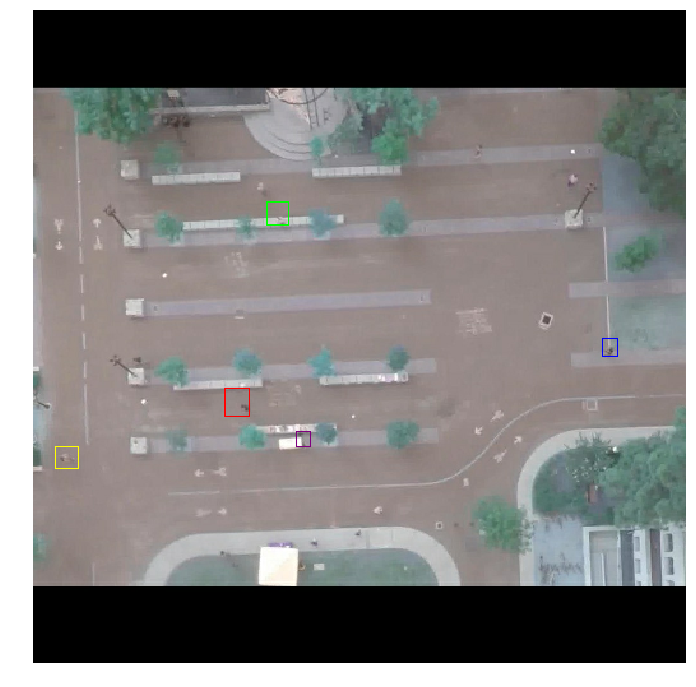

final


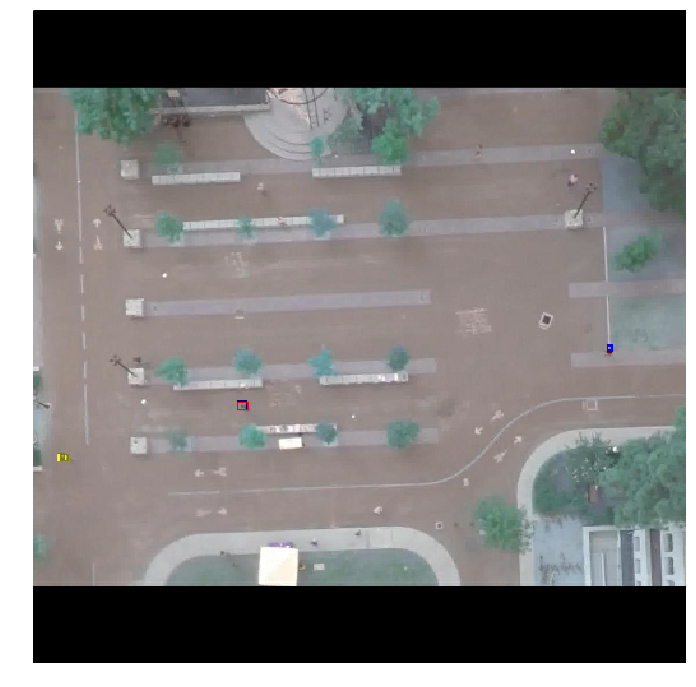

In [86]:
id = 1
run_plot(odgi_singles_nooffsets_output, id)

# Visualize standard model

In [145]:
def build_standard_configuration(log_dir, batch_size=16):
    aux = os.path.dirname(os.path.dirname(os.path.normpath(log_dir)))
    # Datatype
    data = os.path.split(aux)[1]
    configuration = {}
    if data.startswith('vedai'):
        configuration['setting'] = data
        configuration['image_format'] = 'vedai'
    elif data == 'sdd':
        configuration['setting'] = 'sdd'
        configuration['image_format'] = 'sdd'
    elif data == 'dota':
        configuration['setting'] = 'dota'
        configuration['image_format'] = 'dota'
    else:
        raise ValueError("unknown data", data)
    
    # Metadata
    tfrecords_path = 'Data/metadata_%s.txt'
    metadata = defaults.load_metadata(tfrecords_path % configuration['setting'])
    configuration.update(metadata)

    # Architecture
    aux = os.path.split(os.path.dirname(os.path.normpath(log_dir)))[1]
    aux = aux.split('_')
    configuration['network'] = aux[0]
    mode = aux[1]

    assert mode.startswith('standard')
    standard_configuration = configuration.copy()
    standard_configuration['batch_size'] = batch_size
    standard_configuration['base_name'] = configuration['network']
    if len(aux) == 3:
        standard_configuration['image_size'] = int(aux[2])
    else:
        assert aux[2] == '5boxes'
        standard_configuration['num_boxes'] = 5
        standard_configuration['image_size'] = int(aux[3])
    graph_manager.finalize_grid_offsets(standard_configuration, verbose=0)
    
    # Return
    return configuration, standard_configuration

In [179]:
def build_standard_graph(standard_configuration, 
                         viz_threshold=0.75):
    # Graph
    use_test_split = tf.placeholder_with_default(True, (), 'choose_eval_split')
    with tf.device('/gpu:0'):
        eval_inputs, eval_initializer = tf.cond(
            use_test_split,
            true_fn=lambda: graph_manager.get_inputs(mode='test', verbose=False, **standard_configuration),
            false_fn=lambda: graph_manager.get_inputs(mode='val', verbose=False, **standard_configuration),
            name='eval_inputs')
        eval_outputs = standard_graph.eval_pass(
            eval_inputs, standard_configuration, reuse=False, verbose=False)
    # Draw
    output = {}
    all_bbs = eval_outputs['bounding_boxes']
    all_bbs *= tf.to_float(eval_outputs['confidence_scores'] > viz_threshold)
    # initial bounding boxes (confident individuals)
    output['Ground-truth'] = viz.draw_bounding_boxes(eval_inputs['image'], eval_inputs['bounding_boxes'])
    # Final predictions
    output['final'] = viz.draw_bounding_boxes(eval_inputs['image'], all_bbs)
    # non maximum suppression
    all_bbs = tf_utils.flatten_percell_output(all_bbs)
    all_scores = tf_utils.flatten_percell_output(eval_outputs['confidence_scores'])
    boxes = []
    for i in range(standard_configuration['batch_size']):
        b, _ = tf_utils.nms_with_pad(all_bbs[i],
                                      all_scores[i, :, 0], 
                                      1000, iou_threshold=0.5)
        boxes.append(b)
    output['final_nms_0.5'] = viz.draw_bounding_boxes(eval_inputs['image'], tf.stack(boxes, axis=0))
    boxes = []
    for i in range(standard_configuration['batch_size']):
        b, _ = tf_utils.nms_with_pad(all_bbs[i],
                                      all_scores[i, :, 0], 
                                      1000, iou_threshold=0.25)
        boxes.append(b)
    output['final_nms_0.25'] = viz.draw_bounding_boxes(eval_inputs['image'], tf.stack(boxes, axis=0))
    # Return
    return use_test_split, eval_initializer, output

In [180]:
def run_standard_sess(log_dir,
                      batch_size,
                      viz_threshold,
                      skip=0):
    with tf.Graph().as_default():
        # Build config
        _, standard_configuration = build_standard_configuration(log_dir, batch_size=batch_size)
        # Build the graph    
        use_test_split, initializer, output = build_standard_graph(
            standard_configuration, viz_threshold=viz_threshold)
        feed_dict = {use_test_split: True}
        session_creator = tf.train.ChiefSessionCreator(
            checkpoint_dir=log_dir, config=tf.ConfigProto(allow_soft_placement=True))

        # Start session
        with tf.train.MonitoredSession(session_creator=session_creator) as sess:
            sess.run(initializer)
            for _ in range(skip):
                sess.run(output)
            output_ = sess.run(output)     
            return output_

### 1 box

INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./log/sdd/yolov2_standard_1024/10-04_10-19/model.ckpt-57251
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Ground-truth


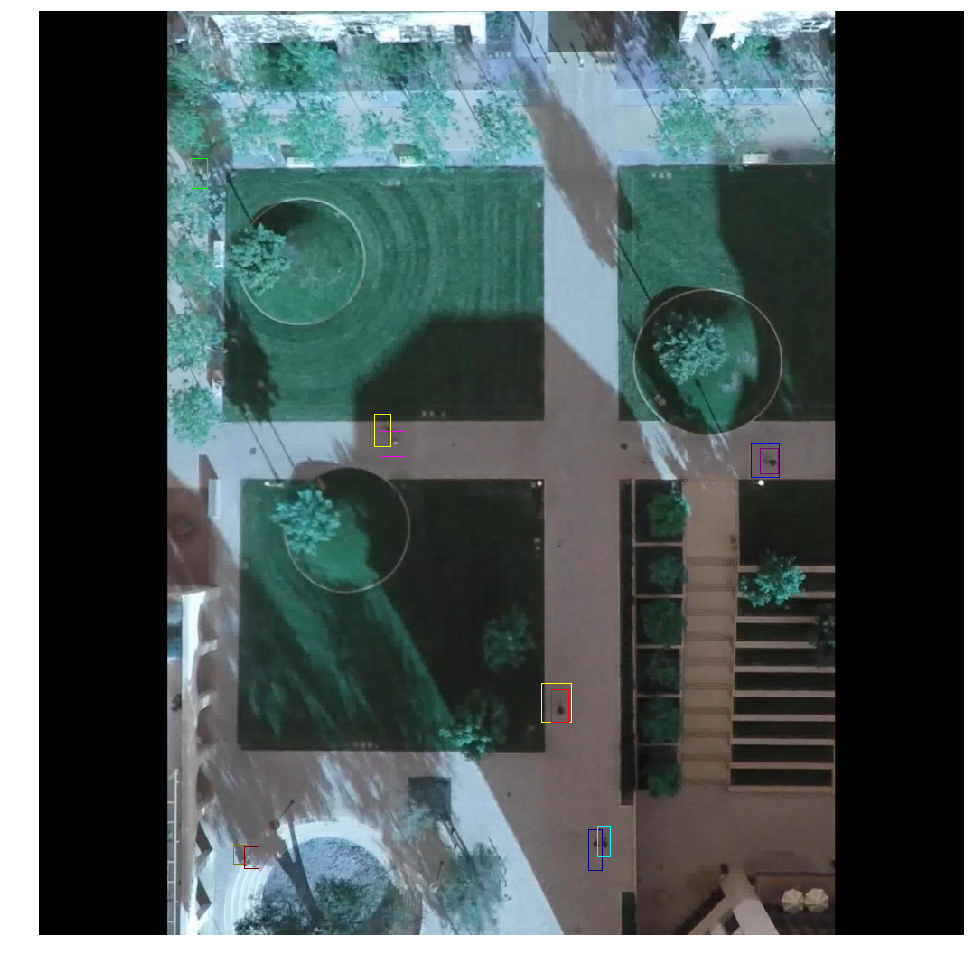

final


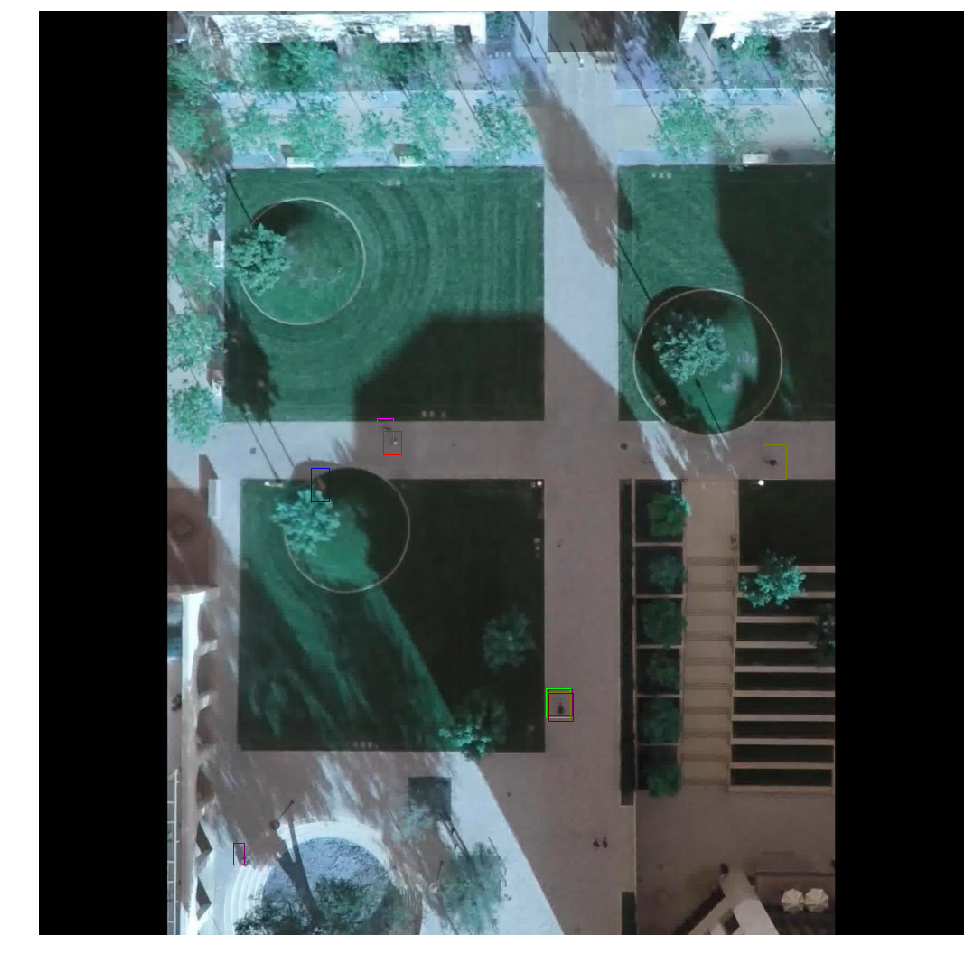

final_nms_0.5


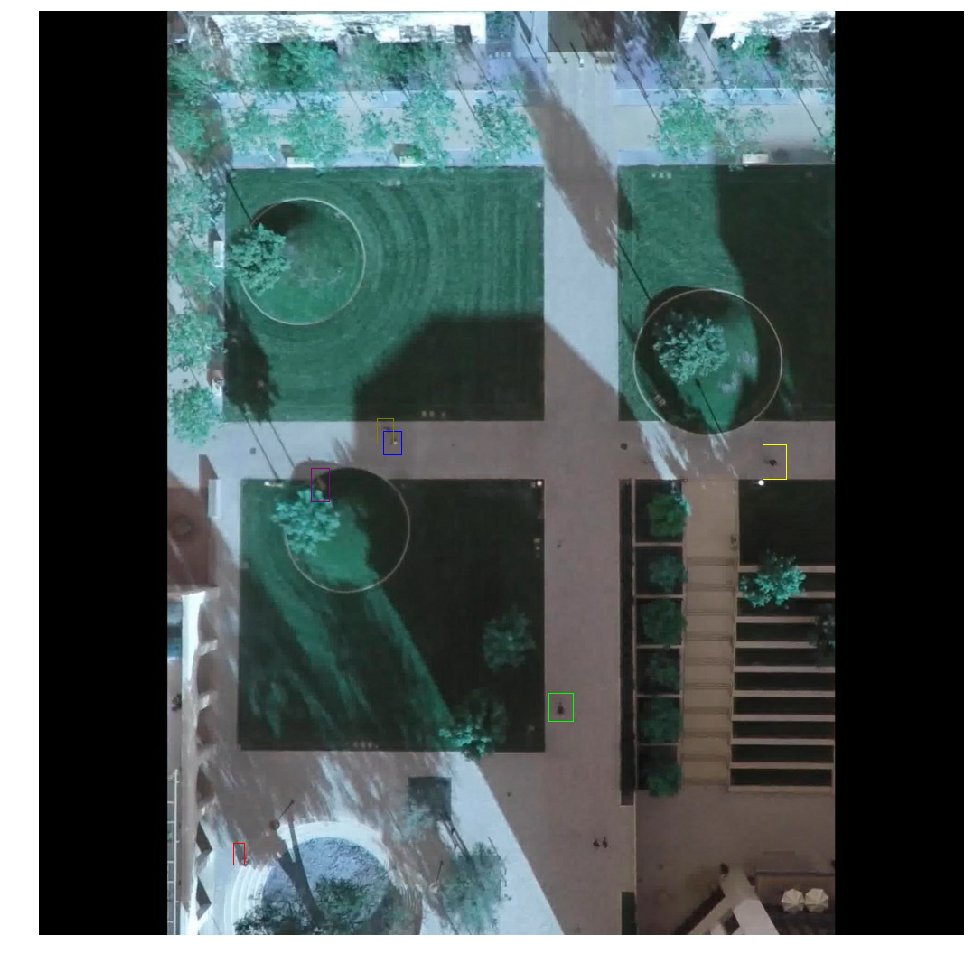

final_nms_0.25


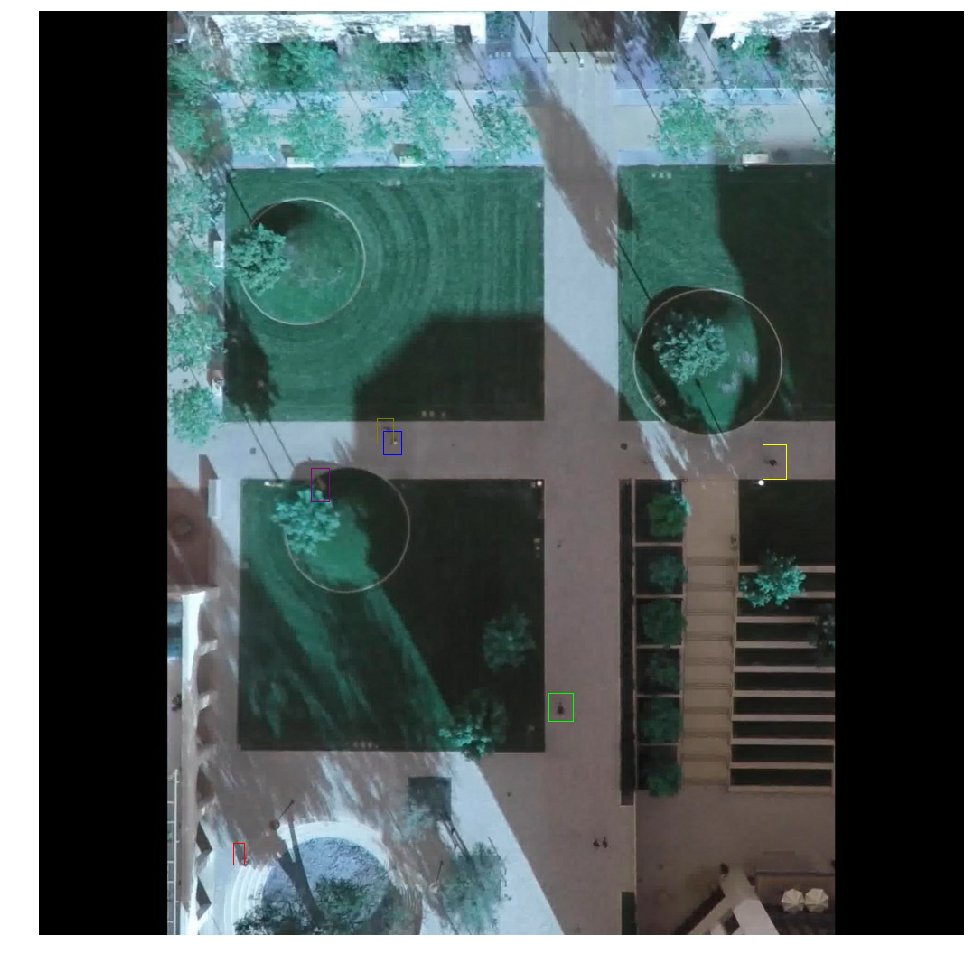

In [191]:
log_dir = './log/sdd/yolov2_standard_1024/10-04_10-19/'
batch_size = 16
viz_threshold = 0.5
skip = 0
skip = 50
skip = 200
skip = 100
standard_output = run_standard_sess(log_dir, batch_size, viz_threshold, skip=skip)

id = 1
run_plot(standard_output, id, figsize=(17, 17))

### 5 boxes

INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./log/sdd/yolov2_standard_5boxes_1024/10-11_16-41/model.ckpt-57251
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Ground-truth


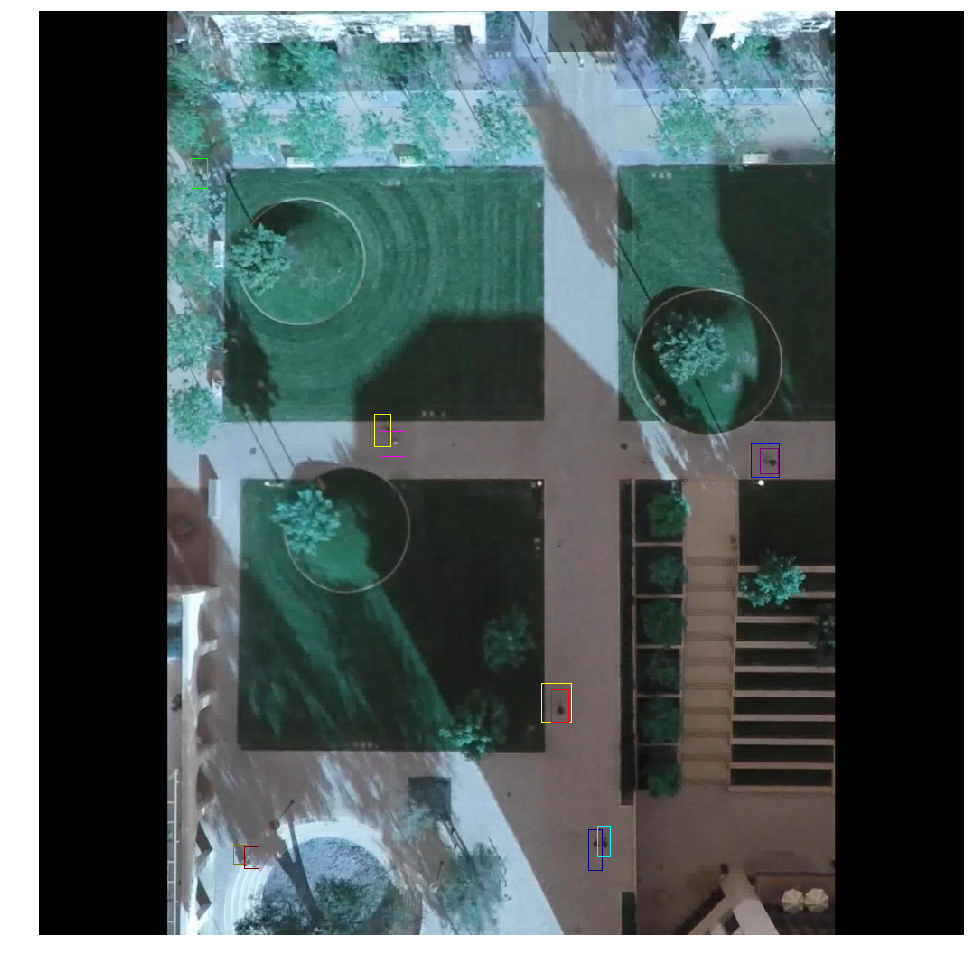

final


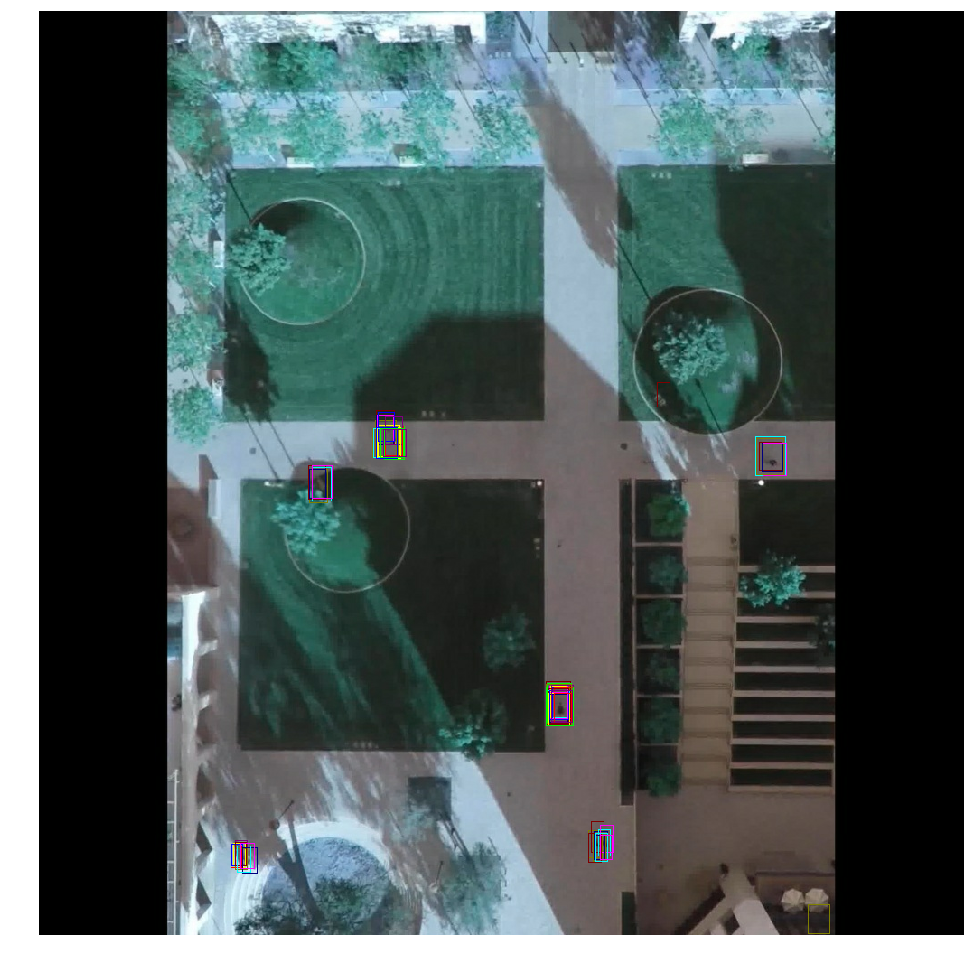

final_nms_0.5


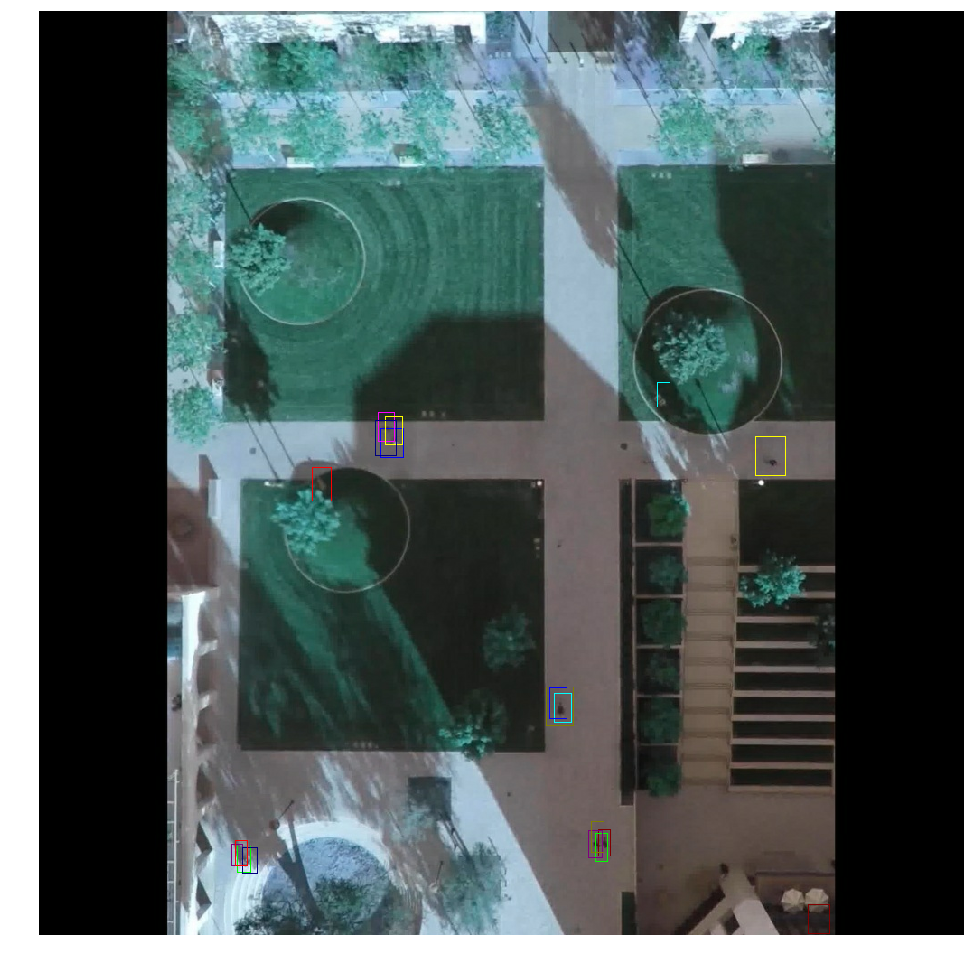

final_nms_0.25


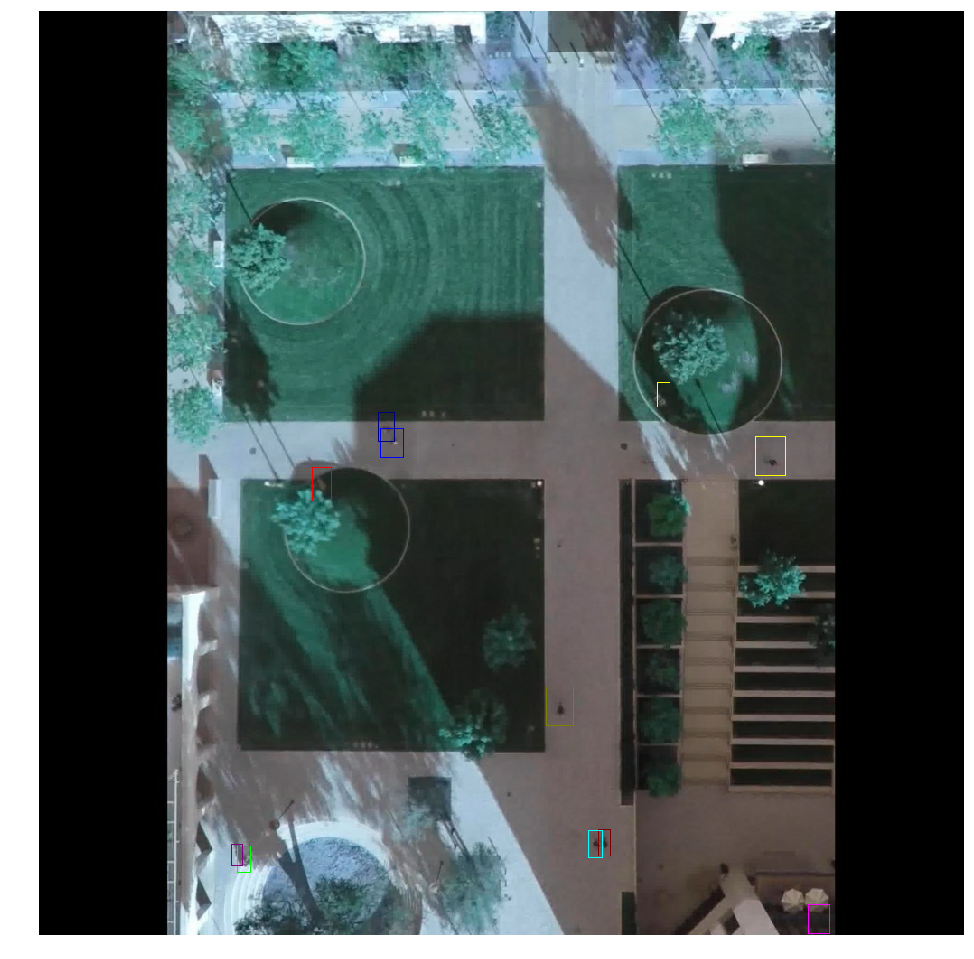

In [186]:
log_dir = './log/sdd/yolov2_standard_5boxes_1024/10-11_16-41/'
batch_size = 16
viz_threshold = 0.5
skip = 0
skip = 50
skip = 200
skip = 100
standard_output = run_standard_sess(log_dir, batch_size, viz_threshold, skip=skip)

id = 1
run_plot(standard_output, id, figsize=(17, 17))